<a href="https://colab.research.google.com/github/py222015328/CEE2/blob/main/Trabalho2_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [104]:
import pandas as pd

df = pd.read_csv("RioDeJaneiro.csv")
df['price'] = df['price'].astype(float)
df['price'] = (df['price'] * 5.40).round(2)
df = df.dropna(axis=1,how='all')
df

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,2302715,guilherme,11706874,Guilherme,Anil,-22.952210,-43.329440,Entire home/apt,14580.0,10,0,NaN,NaN,1,365,0
1,2304688,OLIMPÍADAS 2016,10405816,Eurico,Ipanema,-22.987670,-43.189910,Entire home/apt,4519.8,7,0,NaN,NaN,1,365,0
2,2306547,Amplo Apto com 3 Dormitórios em Copacabana - 1...,4107346,Vera Lucia,Copacabana,-22.973330,-43.188570,Entire home/apt,4320.0,5,13,2025-03-05,0.21,1,257,3
3,2306767,Studio in Copacabana Beach,11386725,Carolina,Copacabana,-22.964770,-43.176050,Entire home/apt,1026.0,3,193,2025-03-03,1.44,6,66,19
4,2308385,Copacabana Ótima opção!,11788583,Ivan,Copacabana,-22.968200,-43.185230,Entire home/apt,1188.0,2,28,2025-03-01,0.21,1,242,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42008,1379748881034779560,Coração da Lapa,552265895,Aparecida,Centro,-22.913532,-43.182839,Entire home/apt,583.2,1,0,NaN,NaN,1,88,0
42009,1379779407258088435,Seu apartamento tropical,183676916,Helcio,Copacabana,-22.972272,-43.187366,Entire home/apt,1944.0,1,0,NaN,NaN,1,89,0
42010,1379780889886191474,Estúdio em Copacabana,684347889,Luiz Fernando,Copacabana,-22.975051,-43.192478,Entire home/apt,1296.0,4,0,NaN,NaN,1,90,0
42011,1379788546387583351,Quarto silencioso e confortável,486066302,Marco,Copacabana,-22.965010,-43.192460,Private room,864.0,1,0,NaN,NaN,1,362,0


In [105]:
df_bairro = df.groupby('neighbourhood')['price'].mean().round(2).reset_index()
df_bairro = df_bairro.sort_values(by=['price'],ascending=True)
df_bairro

,neighbourhood,price
147,Vila Kosmos,275.40
81,Mangueira,313.20
34,Cordovil,318.60
68,Jardim América,410.40
32,Complexo do Alemão,480.60
...,...,...
66,Itanhangá,14350.97
2,Anchieta,14391.00
128,São Conrado,16209.45
73,Joá,35928.28


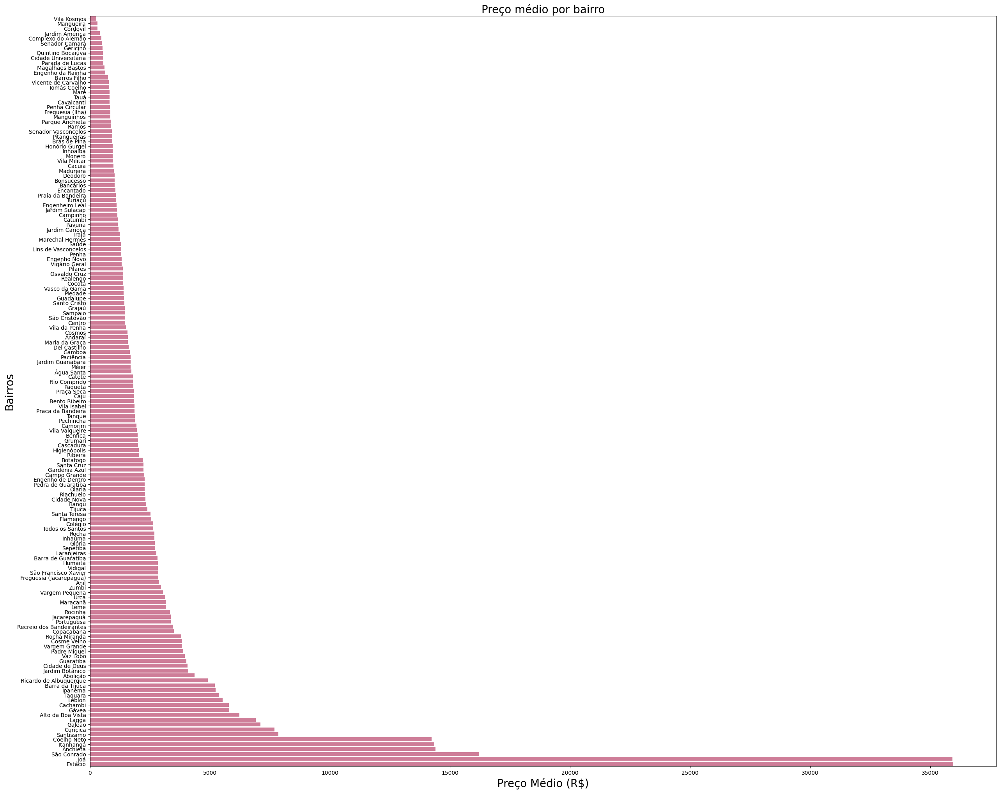

In [109]:
import seaborn as sns
plt.figure(figsize=(30,25))
sns.barplot(data=df_bairro,x='price', y='neighbourhood',errorbar=None, color ='palevioletred')
plt.title('Preço médio por bairro',fontsize=20)
plt.ylabel('Bairros',fontsize=20)
plt.xlabel('Preço Médio (R$)',fontsize=20)
plt.show()

In [110]:
import folium
from IPython.display import HTML

world_map = folium.Map(width=500,height=400)

def mostrar_mapa(mapa, largura=500, altura=400):
    html = mapa.get_root().render()
    display(HTML(f'<div style="width:{largura}px; height:{altura}px;">{html}</div>'))

In [130]:
rio = folium.Map(location=['-22.934418424293515', '-43.41498416659618'],
                 zoom_start=10,
                 control_scale=True,
                 width=500,
                 height=400)
mostrar_mapa(rio)

In [135]:
lugares = df[['latitude','longitude','price']].dropna()
lugares = lugares.values.tolist()
print(lugares)

[[-22.95221, -43.32944, 14580.0], [-22.98767, -43.18991, 4519.8], [-22.97333, -43.18857, 4320.0], [-22.96477, -43.17605, 1026.0], [-22.9682, -43.18523, 1188.0], [-22.91667891412377, -43.19228695068119, 2165.4], [-22.98319, -43.1899, 1182.6], [-22.94274, -43.19016, 2154.6], [-22.98353, -43.19567, 1377.0], [-22.96419715881348, -43.18135070800781, 6085.8], [-22.98473, -43.19852, 4325.4], [-22.91813, -43.24164, 1620.0], [-22.92245483398437, -43.17341613769531, 540.0], [-22.98428, -43.21604, 1474.2], [-22.95188, -43.18268, 5761.8], [-23.00902, -43.30797, 12322.8], [-22.96438, -43.17556, 5832.0], [-22.93233, -43.17946, 1782.0], [-22.915081, -43.24098, 2268.0], [-22.98144, -43.2212, 10800.0], [-22.9832, -43.20042, 8100.0], [-22.9664, -43.1761, 999.0], [-22.96331, -43.17304, 1404.0], [-22.98503, -43.19024, 2203.2], [-23.00475, -43.34805, 2905.2], [-23.00589, -43.3466, 1528.2], [-22.97953, -43.20349, 213840.0], [-22.98574, -43.20074, 3337.2], [-22.97722, -43.19581, 1890.0], [-23.01306, -43.3022

In [140]:
from folium.plugins import HeatMap

lugares = df[['latitude','longitude','price']].dropna()
lugares = lugares.values.tolist()
HeatMap(lugares,radius=10).add_to(rio)
mostrar_mapa(rio)